In [2]:
import pandas as pd
# Load the dataset
file_path = 'FDI_data.csv'
df = pd.read_csv(file_path)

# Display the first few rows of the dataframe to understand its structure
print(df.head(10))

                                           Sector  2000-01  2001-02  2002-03  \
0                        METALLURGICAL INDUSTRIES    22.69    14.14    36.61   
1                                          MINING     1.32     6.52    10.06   
2                                           POWER    89.42   757.44    59.11   
3                         NON-CONVENTIONAL ENERGY     0.00     0.00     1.70   
4                                 COAL PRODUCTION     0.00     0.00     0.00   
5                         PETROLEUM & NATURAL GAS     9.35   211.07    56.78   
6             BOILERS AND STEAM GENERATING PLANTS     0.00     0.00     0.00   
7  PRIME MOVER (OTHER THAN ELECTRICAL GENERATORS)     0.00     0.00     0.00   
8                           ELECTRICAL EQUIPMENTS    79.76    65.76    34.71   
9                    COMPUTER SOFTWARE & HARDWARE   228.39   419.39   314.24   

   2003-04  2004-05  2005-06  2006-07  2007-08  2008-09  2009-10  2010-11  \
0     8.11   200.38   149.13   169.94  117

In [3]:
df.shape

(63, 18)

In [4]:
# Check for missing values and data types
df.isnull().sum()

Sector     0
2000-01    0
2001-02    0
2002-03    0
2003-04    0
2004-05    0
2005-06    0
2006-07    0
2007-08    0
2008-09    0
2009-10    0
2010-11    0
2011-12    0
2012-13    0
2013-14    0
2014-15    0
2015-16    0
2016-17    0
dtype: int64

Data Preview: The dataset includes sector-wise FDI values from the financial year 2000-01 to 2016-17. Each row represents a sector with corresponding investment values for each year.
Missing Data: There are no missing values in any of the columns, which simplifies the preprocessing step.
Data Types: All financial year columns are of type float64, which is appropriate for numerical operations. The 'Sector' column is of type object, suitable for categorical data.

In [5]:
df.describe()

,2000-01,2001-02,2002-03,2003-04,2004-05,2005-06,2006-07,2007-08,2008-09,2009-10,2010-11,2011-12,2012-13,2013-14,2014-15,2015-16,2016-17
count,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000
mean,37.757302,63.931587,42.925714,34.727778,51.090317,87.932540,198.281905,390.085714,498.348571,410.069524,339.413810,557.472698,355.930000,385.703492,490.959841,634.936349,690.131111
std,112.227860,157.878737,86.606439,67.653735,101.934873,206.436967,686.783115,1026.249935,1134.649040,926.814626,627.141139,1031.474056,778.091368,658.429944,837.787060,1335.307706,1411.965354
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.200000,0.215000,0.715000,1.230000,4.160000,9.950000,11.950000,7.880000,8.430000,22.720000,15.115000,16.610000,33.800000,30.000000,19.905000
50%,4.030000,5.070000,11.010000,6.370000,9.090000,22.620000,25.820000,58.820000,84.880000,69.740000,58.070000,129.360000,95.410000,113.780000,177.220000,159.130000,110.860000
75%,23.510000,44.830000,36.555000,38.660000,43.205000,63.855000,108.325000,279.270000,383.320000,341.595000,304.280000,593.525000,288.025000,473.060000,595.390000,519.070000,741.220000
max,832.070000,873.230000,419.960000,368.320000,527.900000,1359.970000,4713.780000,6986.170000,6183.490000,5466.130000,3296.090000,5215.980000,4832.980000,3982.890000,4443.260000,6889.460000,8684.070000


1. Each year consistently has data for 63 sectors.
2. Mean: The average investment per sector each year, which shows a general upward trend over the years.
3. Here are some specific details for selected years:
There is a high difference between mean and median coupled with high standard deviation for almost all years, which indicates the presence of outliers in the dataset
In most cases, there is a big difference between the mean and the max values, the mean is greater than the median, which indicates right skewed dataset, with outliers on the higher end. The high SD also shows the apread of data away from the mean

Number of outliers per year:
2000-01    11
2001-02     9
2002-03     7
2003-04     7
2004-05    10
2005-06     9
2006-07     5
2007-08     8
2008-09     8
2009-10     8
2010-11     9
2011-12     8
2012-13     8
2013-14     7
2014-15     6
2015-16     8
2016-17     7
dtype: int64


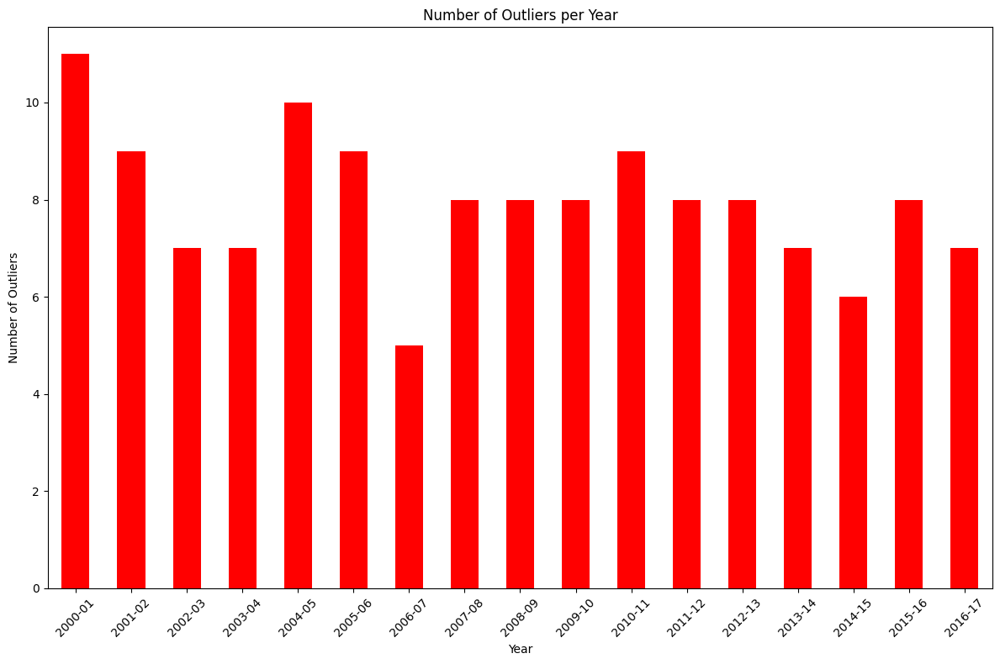

In [6]:
# Excluding the 'Sector' column and detecting outliers in the numeric columns
import matplotlib.pyplot as plt

numeric_df = df.drop(columns=['Sector'])
Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1

# Outlier detection criteria
outliers = (numeric_df < (Q1 - 1.5 * IQR)) | (numeric_df > (Q3 + 1.5 * IQR))

# Summarizing the number of outliers per year
outlier_counts = outliers.sum()
print('Number of outliers per year:')
print(outlier_counts)

# Plotting the number of outliers per year
plt.figure(figsize=(12, 8), facecolor='white')
outlier_counts.plot(kind='bar', color='red')
plt.title('Number of Outliers per Year')
plt.xlabel('Year')
plt.ylabel('Number of Outliers')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [7]:
# Applying the 99th percentile cap method to handle outliers
percentile_99 = df.drop(columns=['Sector']).quantile(0.99)
df2 = df.drop(columns=['Sector']).clip(upper=percentile_99, axis=1)
df2['Sector'] = df['Sector']  # Re-adding the Sector column

# Displaying the first few rows after capping
print('First few rows after applying 99th percentile cap:')
print(df2.head())

First few rows after applying 99th percentile cap:
   2000-01  2001-02  2002-03  2003-04  2004-05  2005-06  2006-07  2007-08  \
0    22.69    14.14    36.61     8.11   200.38   149.13   169.94  1175.75   
1     1.32     6.52    10.06    23.48     9.92     7.40     6.62   444.36   
2    89.42   757.44    59.11    27.09    43.37    72.69   157.15   988.68   
3     0.00     0.00     1.70     4.14     1.27     1.35     2.44    58.82   
4     0.00     0.00     0.00     0.04     0.00     9.14     1.30    14.08   

   2008-09  2009-10  2010-11  2011-12  2012-13  2013-14  2014-15  2015-16  \
0   959.94   419.88  1098.14  1786.14  1466.23   567.63   359.34   456.31   
1    34.16   174.40    79.51   142.65    57.89    12.73   684.39   520.67   
2   907.66  1271.79  1271.77  1652.38   535.68  1066.08   707.04   868.80   
3   125.88   622.52   214.40   452.17  1106.52   414.25   615.95   776.51   
4     0.22     0.00     0.00     0.00     0.00     2.96     0.00     0.00   

   2016-17             

In [8]:
df2.shape

(63, 18)

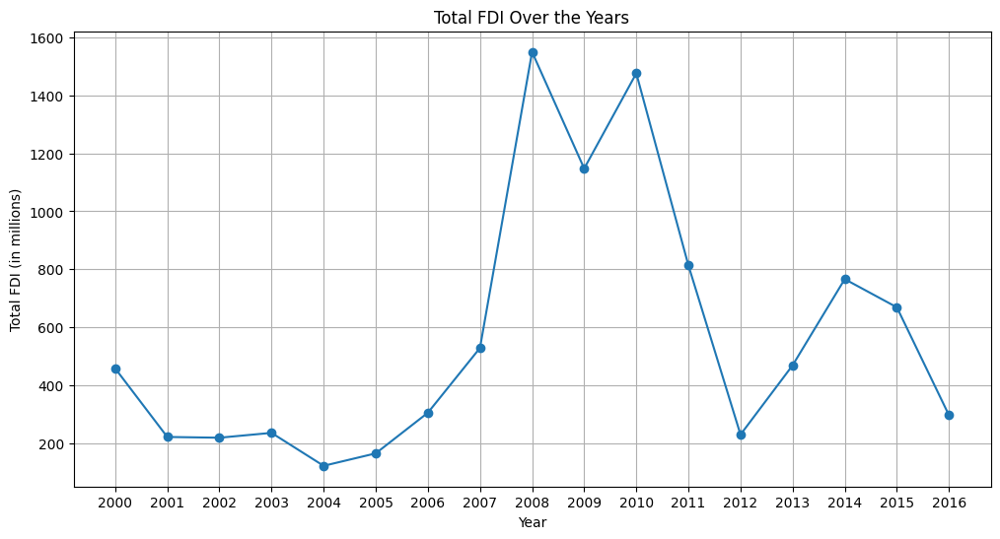

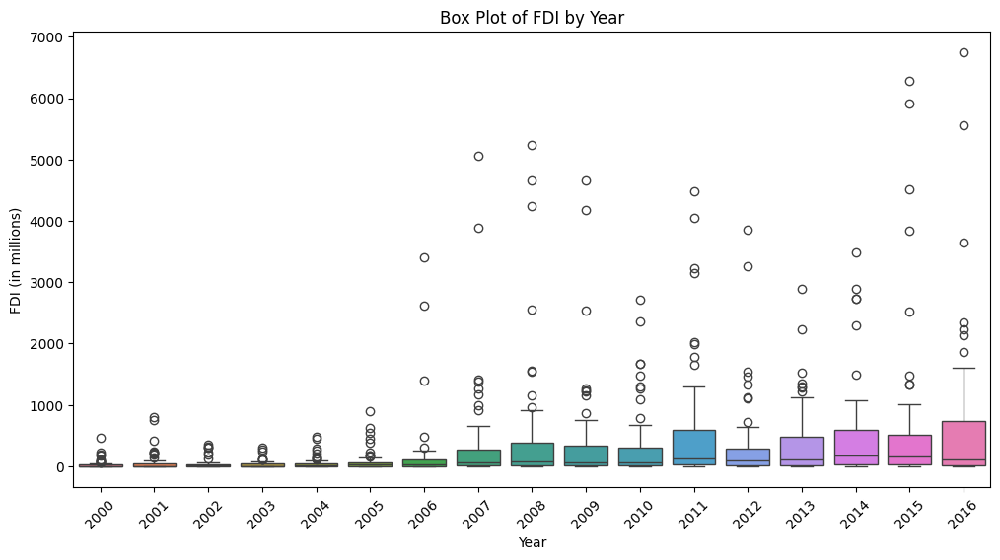

In [9]:
import seaborn as sns
# Drop the 'Sector' column and convert data to numeric
df2_numeric = df2.drop(columns=['Sector']).apply(pd.to_numeric, errors='coerce')

# Sum the FDI values for each year
df2_numeric['Total FDI'] = df2_numeric.sum(axis=1)

# Rename the columns to represent years more clearly
df2_numeric.columns = [col.split('-')[0] for col in df2_numeric.columns[:-1]] + ['Total FDI']


# Plotting the total FDI over the years
plt.figure(figsize=(12, 6), facecolor='white')
plt.plot(df2_numeric.columns[:-1], df2_numeric.iloc[-1, :-1], marker='o')
plt.title('Total FDI Over the Years')
plt.xlabel('Year')
plt.ylabel('Total FDI (in millions)')
plt.grid(True)
plt.show()

# Box plots for each year
plt.figure(figsize=(12, 6), facecolor='white')
sns.boxplot(data=df2_numeric.drop(columns=['Total FDI']))
plt.title('Box Plot of FDI by Year')
plt.xlabel('Year')
plt.ylabel('FDI (in millions)')
plt.xticks(rotation=45)
plt.show()

Analysis of Visualizations:
Time Series Plot: There appears to be a general upward trend in total FDI over the years, with some fluctuations. This could indicate periods of economic growth or increased foreign interest in investment.

Box Plots: The box plots show a wide range of FDI values within each year, with several outliers indicating exceptionally high investments in certain years. The median FDI remains relatively stable compared to the mean, which is influenced by high-value outliers.

In [10]:
df2_numeric.shape

(63, 18)

In [11]:
df2_numeric.columns[:-1]

Index(['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008',
       '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016'],
      dtype='object')

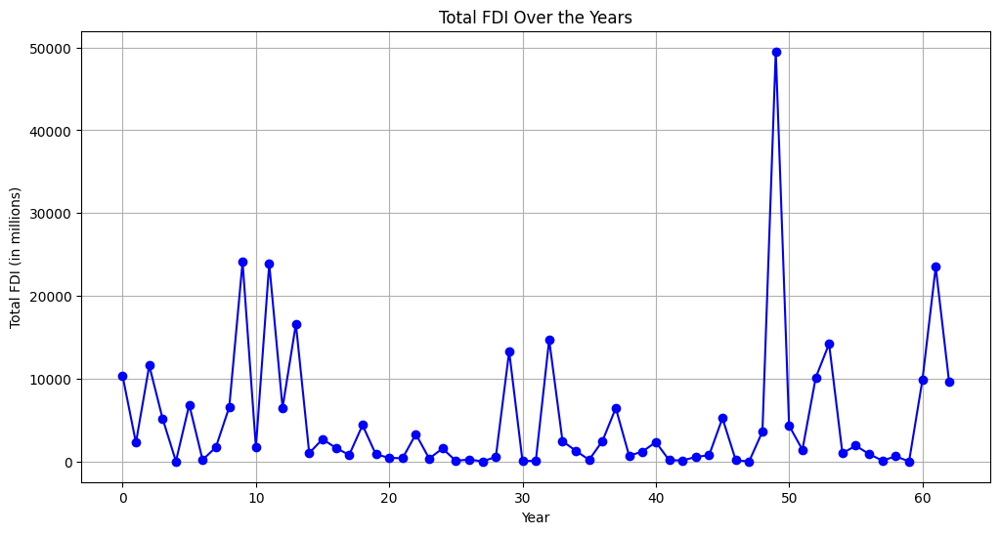

In [12]:
import matplotlib.pyplot as plt

# Assuming df_numeric is your DataFrame and it's already loaded and prepared
# Plotting the total FDI over the years
plt.figure(figsize=(12, 6), facecolor='white')
plt.plot(df2_numeric.index, df2_numeric['Total FDI'], marker='o', linestyle='-', color='b')
plt.title('Total FDI Over the Years')
plt.xlabel('Year')
plt.ylabel('Total FDI (in millions)')
plt.grid(True)
plt.show()

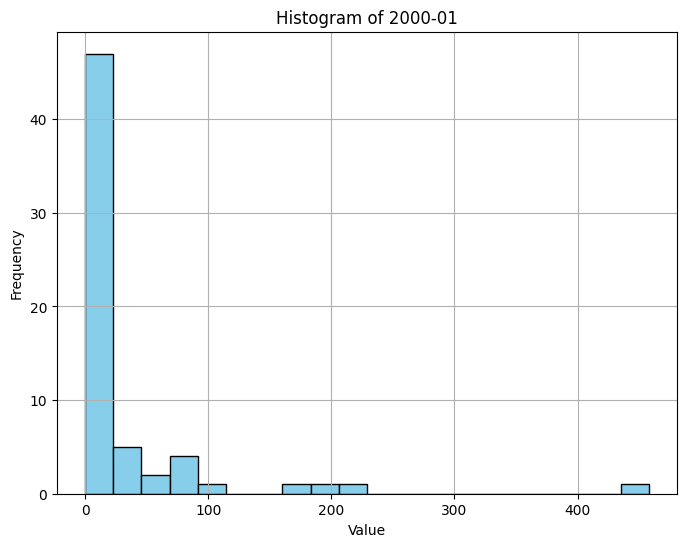

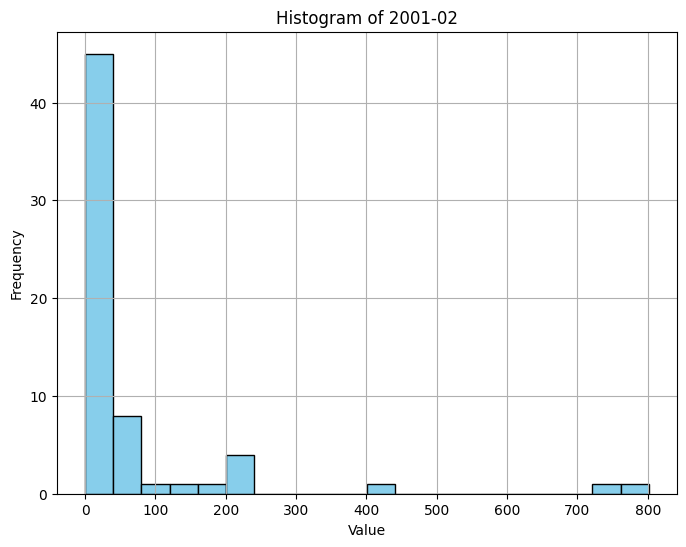

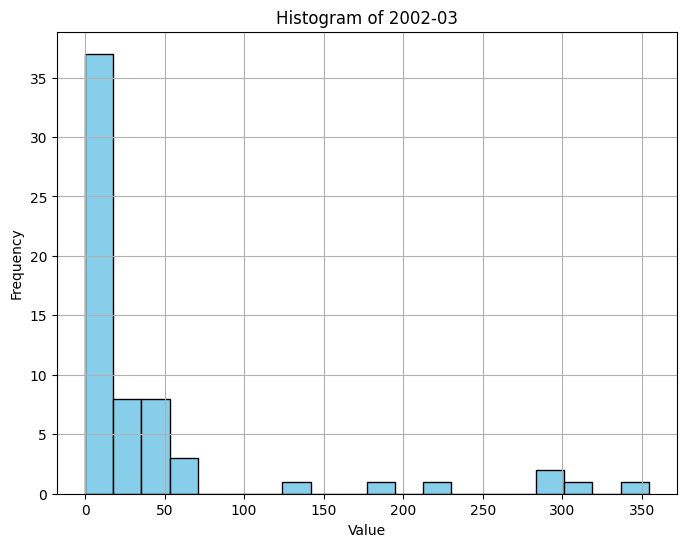

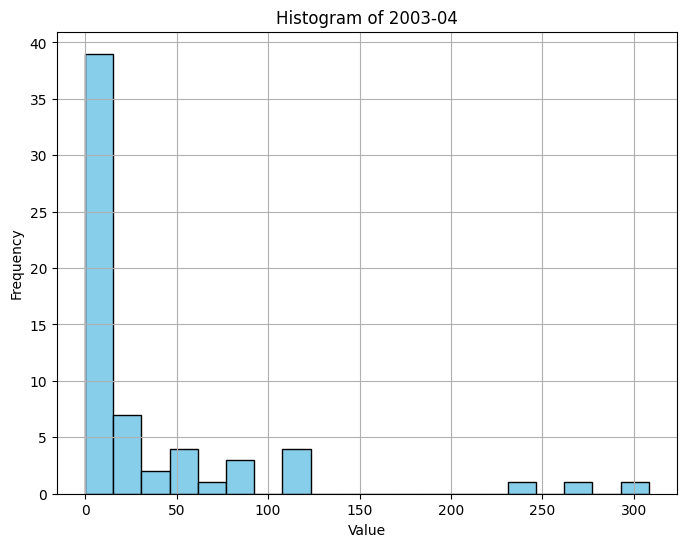

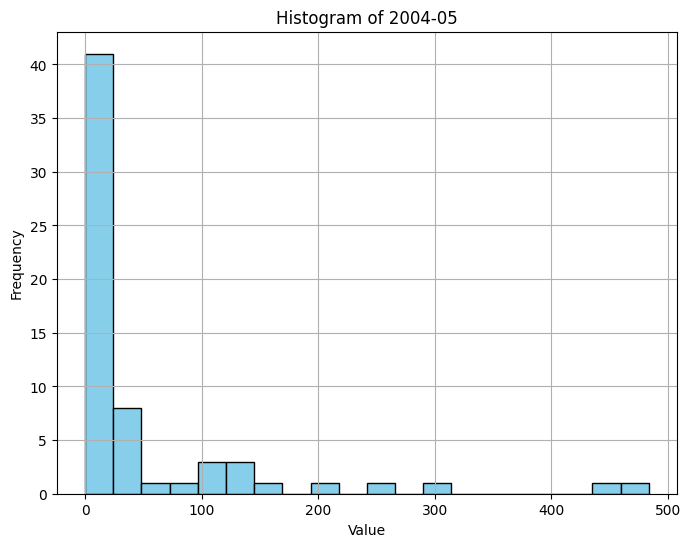

...

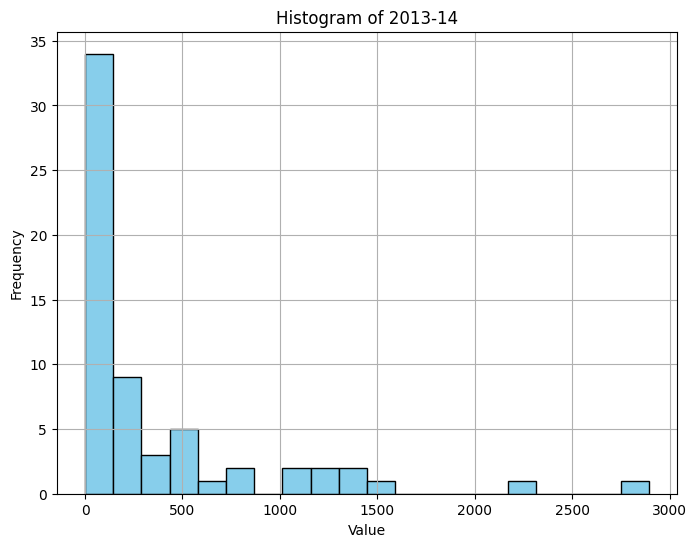

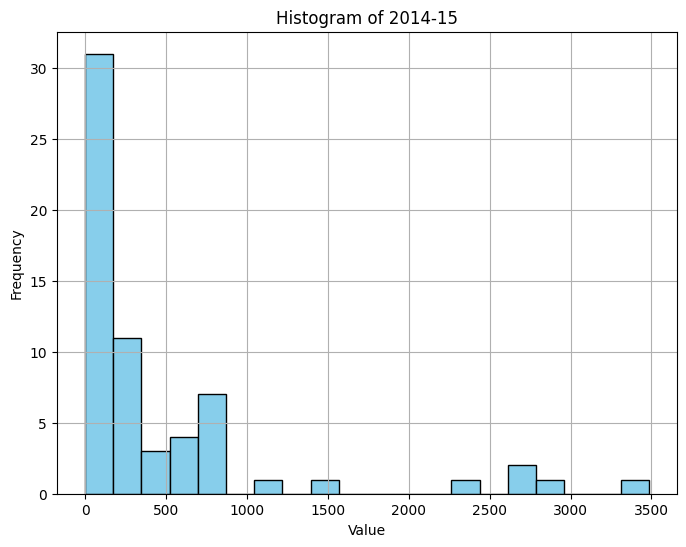

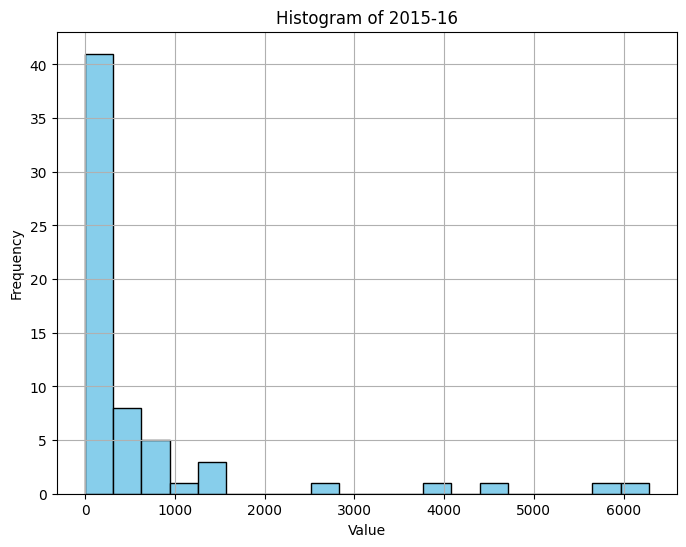

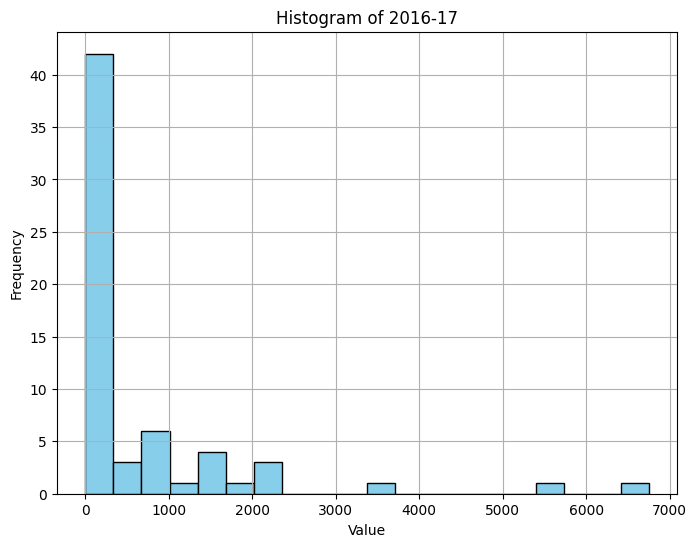

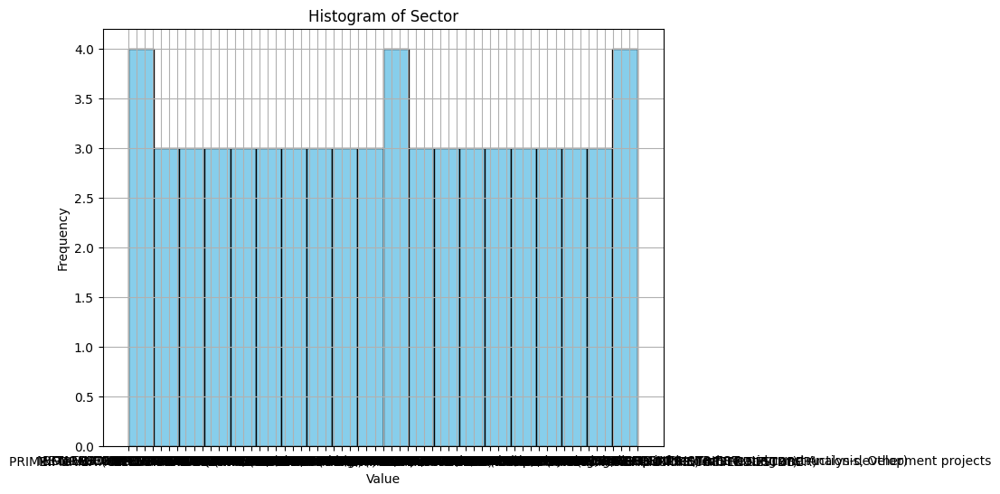

In [13]:
import matplotlib.pyplot as plt

# Assuming df is already loaded and contains the necessary data

# Iterate over each column in the dataframe
for column in df2.columns:
    # Create a new figure for each histogram
    plt.figure(figsize=(8, 6))

    # Plot histogram for the current column
    plt.hist(df2[column], bins=20, color='skyblue', edgecolor='black')

    # Set plot title and labels
    plt.title(f'Histogram of {column}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

    # Show grid
    plt.grid(True)

    # Show plot
    plt.show()


In [14]:

# Set the index to 'Sector' for easier plotting
df2.set_index('Sector', inplace=True)

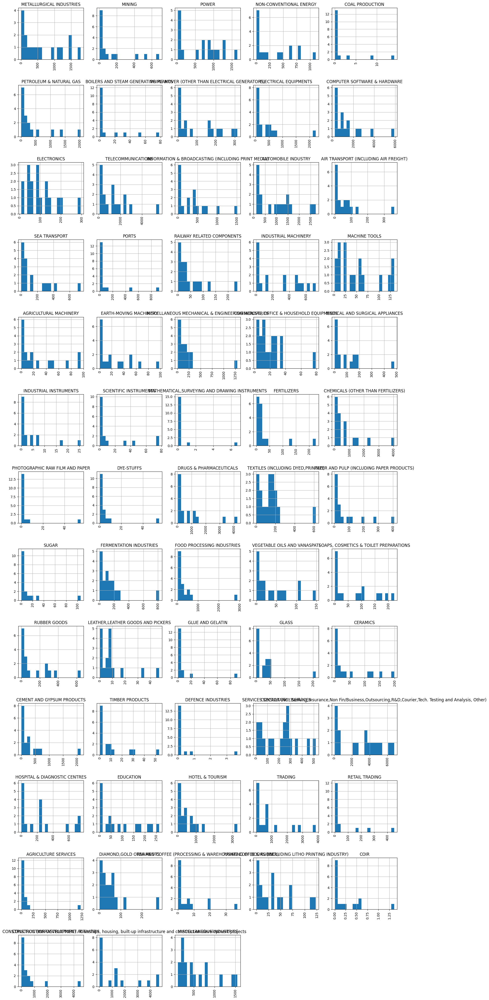

In [15]:
import pandas as pd
import matplotlib.pyplot as plt


# Create a figure with subplots
num_sectors = len(df2.index)
rows = (num_sectors + 4) // 5  # Calculate the number of rows needed
fig, axes = plt.subplots(nrows=rows, ncols=5, figsize=(20, 4 * rows))
axes = axes.flatten()  # Flatten the axes to make it easier to iterate

# Loop through each sector and create a histogram on a separate subplot
for i, sector in enumerate(df2.index):
    ax = axes[i]
    df2.loc[sector].hist(ax=ax, bins=20)
    ax.set_title(sector)
    ax.tick_params(axis='x', rotation=90)  # Rotate x-axis labels for better visibility

# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Display the plot
plt.show()

In [16]:
# Rename the columns to represent years more clearly
#df2.columns = [col.split('-')[0] for col in df2.columns[:-1]] + ['Total FDI']

In [17]:
# Rename the columns to represent years more clearly in the format 'YYYY_YY'
df2.columns = [f"{col.split('-')[0]}_{col.split('-')[1]}" for col in df2.columns]

In [18]:
# Rename the columns to represent years more clearly in the format 'YYYY_YY'
df2.columns = [col.replace('-', '_') for col in df2.columns]

In [19]:
df2.columns

Index(['2000_01', '2001_02', '2002_03', '2003_04', '2004_05', '2005_06',
       '2006_07', '2007_08', '2008_09', '2009_10', '2010_11', '2011_12',
       '2012_13', '2013_14', '2014_15', '2015_16', '2016_17'],
      dtype='object')

In [20]:
# Calculate the total FDI for each sector by summing across all years
df2['Total FDI'] = df2.sum(axis=1)

# Sort the sectors by total FDI in descending order and display the top sectors
top_sectors = df2['Total FDI'].sort_values(ascending=False)
print(top_sectors.head())

Sector
SERVICES SECTOR (Fin.,Banking,Insurance,Non Fin/Business,Outsourcing,R&D,Courier,Tech. Testing and Analysis, Other)    49513.1148
COMPUTER SOFTWARE & HARDWARE                                                                                           24104.7258
TELECOMMUNICATIONS                                                                                                     23874.2202
CONSTRUCTION DEVELOPMENT: Townships, housing, built-up infrastructure and construction-development projects            23492.2980
AUTOMOBILE INDUSTRY                                                                                                    16608.3736
Name: Total FDI, dtype: float64


These sectors have the highest cumulative FDI contributions over the years.

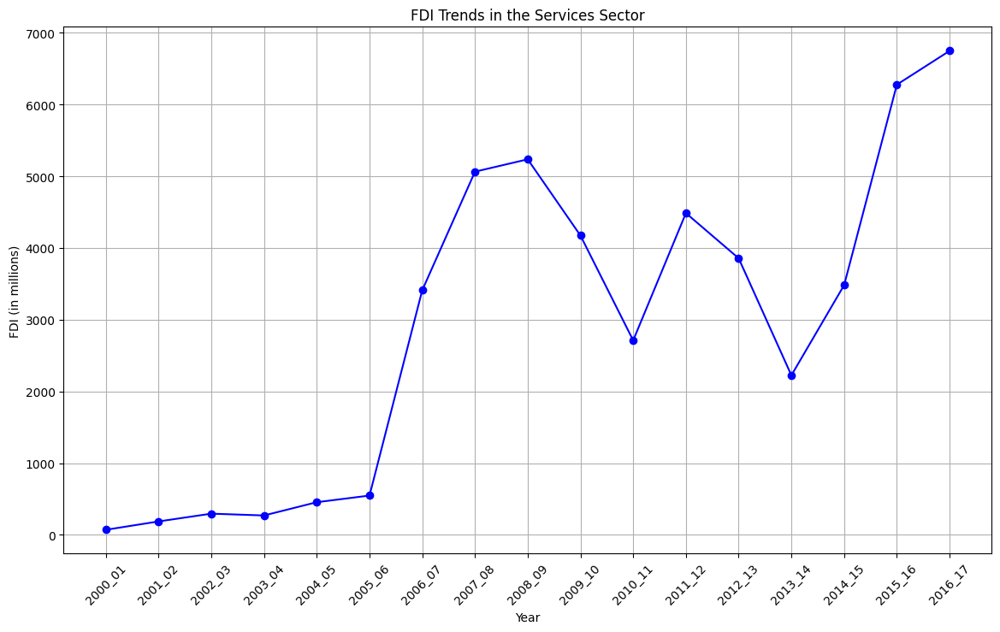

In [21]:
# Extract the FDI data for the Services Sector over the years
services_fdi = df2.loc['SERVICES SECTOR (Fin.,Banking,Insurance,Non Fin/Business,Outsourcing,R&D,Courier,Tech. Testing and Analysis, Other)']

# Remove the total FDI column for plotting
services_fdi = services_fdi.drop('Total FDI')

# Plotting the FDI trend for the Services Sector
fig, ax = plt.subplots(figsize=(14, 8), facecolor='white')
ax.plot(services_fdi.index, services_fdi, marker='o', linestyle='-', color='b')
ax.set_xlabel('Year')
ax.set_ylabel('FDI (in millions)')
ax.set_title('FDI Trends in the Services Sector')
ax.grid(True)

plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

In [22]:
# Extracting the last 5 years from the dataset
df_recent_5_years = df2[df2.columns[-5:]]

# Calculating the total FDI for each sector over the last 5 years
df_recent_5_years['Total FDI Last 5 Years'] = df_recent_5_years.sum(axis=1)

# Sorting the sectors by total FDI in descending order for the last 5 years
top_sectors_recent = df_recent_5_years['Total FDI'].sort_values(ascending=False)
print(top_sectors_recent.head())

Sector
SERVICES SECTOR (Fin.,Banking,Insurance,Non Fin/Business,Outsourcing,R&D,Courier,Tech. Testing and Analysis, Other)    49513.1148
COMPUTER SOFTWARE & HARDWARE                                                                                           24104.7258
TELECOMMUNICATIONS                                                                                                     23874.2202
CONSTRUCTION DEVELOPMENT: Townships, housing, built-up infrastructure and construction-development projects            23492.2980
AUTOMOBILE INDUSTRY                                                                                                    16608.3736
Name: Total FDI, dtype: float64


<ipython-input-22-56e7f1e3a5cf>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_recent_5_years['Total FDI Last 5 Years'] = df_recent_5_years.sum(axis=1)


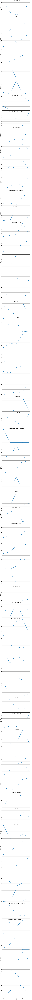

In [23]:
# Plotting all sectors for FDI in the past 5 years in separate subplots, excluding the last column and adding custom x-axis labels
fig, axs = plt.subplots(len(df2.index), 1, figsize=(10, 5 * len(df2.index)), facecolor='white', sharex=True)

x_labels = ['2012', '2013', '2014', '2015', '2016']

for i, sector in enumerate(df2.index):
    axs[i].plot(df2.columns[-6:-1], df2.loc[sector, df2.columns[-6:-1]], marker='o', linestyle='-')
    axs[i].set_title(sector)
    axs[i].grid(True)
    axs[i].set_ylabel('FDI (in millions)')

plt.xlabel('Year')
plt.xticks(range(5), x_labels, rotation=45)
plt.tight_layout()
plt.show()

In [24]:
df2.columns[-6:-1]

Index(['2012_13', '2013_14', '2014_15', '2015_16', '2016_17'], dtype='object')

In [25]:
import pandas as pd

# Assuming 'df2' is your DataFrame and it has yearly columns for FDI values
# Create a pivot table for the specific years 2000-01 and 2015-16
pivot_table_specific_years = pd.pivot_table(df2, values=['2000_01', '2016_17'], index='Sector', aggfunc='sum')
pivot_table_specific_years.head(60)

# display maximum rows

pd.set_option("display.max_rows", 60)
pivot_table_specific_years.head(60)

,2000_01,2016_17
Sector,,
AGRICULTURAL MACHINERY,3.6400,15.1900
AGRICULTURE SERVICES,17.5200,76.4300
AIR TRANSPORT (INCLUDING AIR FREIGHT),0.0000,83.4000
AUTOMOBILE INDUSTRY,195.3300,1609.3200
BOILERS AND STEAM GENERATING PLANTS,0.0000,53.9100
CEMENT AND GYPSUM PRODUCTS,67.7200,2130.1000
CERAMICS,4.0300,15.4000
CHEMICALS (OTHER THAN FERTILIZERS),111.1400,1392.8000
COAL PRODUCTION,0.0000,0.0000


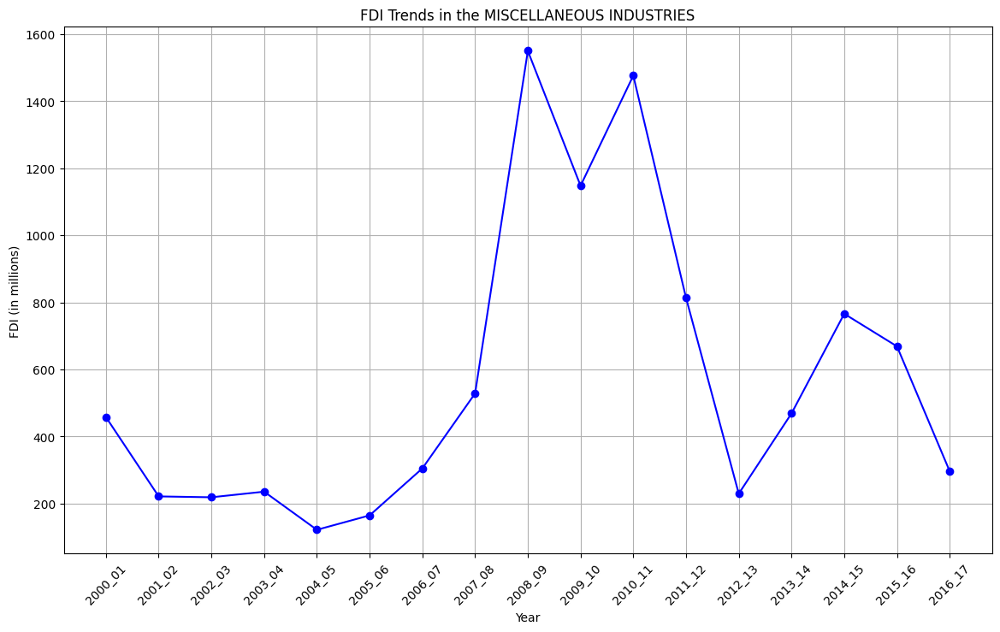

In [26]:
# Extract the FDI data for the Services Sector over the years
services_fdi = df2.loc['MISCELLANEOUS INDUSTRIES']

# Remove the total FDI column for plotting
services_fdi = services_fdi.drop('Total FDI')

# Plotting the FDI trend for the Services Sector
fig, ax = plt.subplots(figsize=(14, 8), facecolor='white')
ax.plot(services_fdi.index, services_fdi, marker='o', linestyle='-', color='b')
ax.set_xlabel('Year')
ax.set_ylabel('FDI (in millions)')
ax.set_title('FDI Trends in the MISCELLANEOUS INDUSTRIES')
ax.grid(True)

plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

<Figure size 1000x800 with 0 Axes>

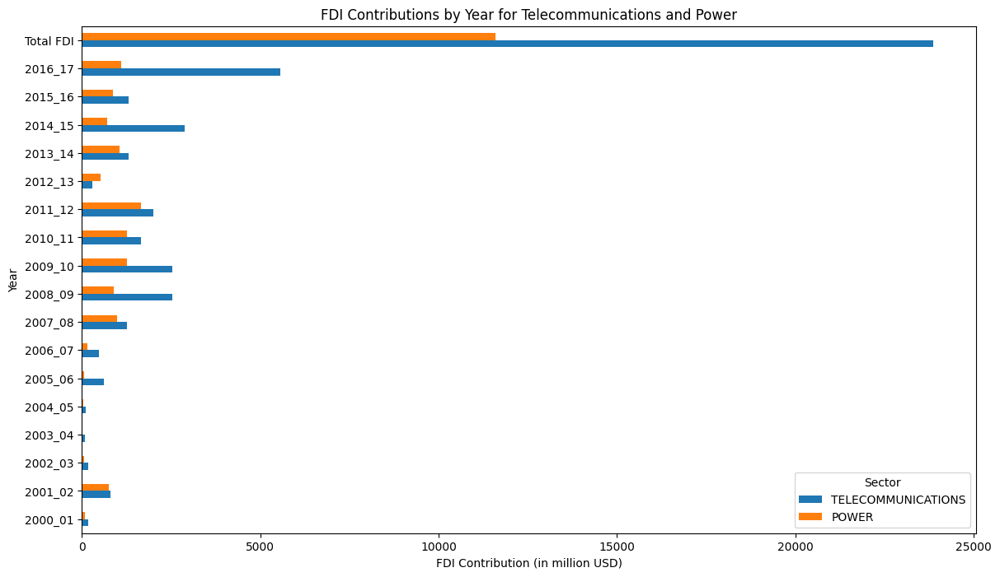

In [27]:
# Filter data for 'Telecommunications' and 'Power' sectors
sectors_data = df2.loc[['TELECOMMUNICATIONS', 'POWER']]

# Transpose the data for plotting
sectors_data = sectors_data.transpose()

# Plotting
plt.figure(figsize=(10, 8), facecolor='white')
sectors_data.plot(kind='barh', figsize=(14, 8))
plt.title('FDI Contributions by Year for Telecommunications and Power')
plt.xlabel('FDI Contribution (in million USD)')
plt.ylabel('Year')
plt.legend(title='Sector')
plt.show()

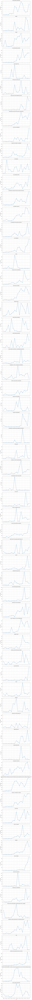

In [28]:
# Plotting all sectors for FDI in the past 5 years in separate subplots, excluding the last column and adding custom x-axis labels
fig, axs = plt.subplots(len(df2.index), 1, figsize=(10, 5 * len(df2.index)), facecolor='white', sharex=True)

x_labels = ['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016']

for i, sector in enumerate(df2.index):
    axs[i].plot(df2.columns[:-1], df2.loc[sector, df2.columns[:-1]], marker='o', linestyle='-')
    axs[i].set_title(sector)
    axs[i].grid(True)
    axs[i].set_ylabel('FDI (in millions)')

plt.xlabel('Year')
plt.xticks(range(17), x_labels, rotation=45)
plt.tight_layout()
plt.show()

In [29]:
df2.columns[:-1]

Index(['2000_01', '2001_02', '2002_03', '2003_04', '2004_05', '2005_06',
       '2006_07', '2007_08', '2008_09', '2009_10', '2010_11', '2011_12',
       '2012_13', '2013_14', '2014_15', '2015_16', '2016_17'],
      dtype='object')

In [30]:
# Drop the 'FDI' column in place
#df2.drop('Total FDI', axis=1, inplace=True)
#df2.drop('Total FDI', axis=1, inplace=True)
df2.drop('Total FDI', axis=1, inplace=True)


In [31]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 63 entries, METALLURGICAL INDUSTRIES to MISCELLANEOUS INDUSTRIES
Data columns (total 17 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   2000_01  63 non-null     float64
 1   2001_02  63 non-null     float64
 2   2002_03  63 non-null     float64
 3   2003_04  63 non-null     float64
 4   2004_05  63 non-null     float64
 5   2005_06  63 non-null     float64
 6   2006_07  63 non-null     float64
 7   2007_08  63 non-null     float64
 8   2008_09  63 non-null     float64
 9   2009_10  63 non-null     float64
 10  2010_11  63 non-null     float64
 11  2011_12  63 non-null     float64
 12  2012_13  63 non-null     float64
 13  2013_14  63 non-null     float64
 14  2014_15  63 non-null     float64
 15  2015_16  63 non-null     float64
 16  2016_17  63 non-null     float64
dtypes: float64(17)
memory usage: 10.9+ KB


In [32]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource
from bokeh.layouts import gridplot
import numpy as np
# Prepare a list of histograms
histograms = []
for sector in df2.index.unique():
    data = df2.loc[sector].values.flatten()
    hist, edges = np.histogram(data, bins=20)
    p = figure(title='Histogram of FDI for' + sector, tools='', background_fill_color='#fafafa', width=400, height=300)
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], fill_color='navy', line_color='white', alpha=0.7)
    histograms.append(p)

# Arrange plots in a grid
grid = gridplot(histograms, ncols=3)

# Show the results in the notebook
output_notebook()
show(grid)

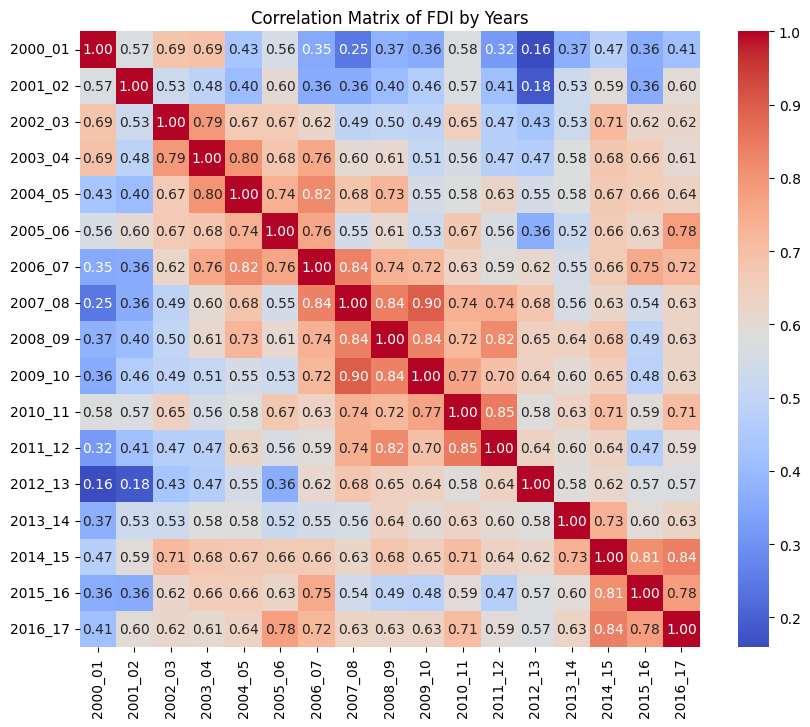

In [33]:
# Calculate the correlation matrix
corr_matrix = df2.corr()

# Plotting the correlation matrix using seaborn
plt.figure(figsize=(10, 8), facecolor='white')
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
plt.title('Correlation Matrix of FDI by Years')
plt.show()

70 and above 70 correlation values:

1. 2000_01 – 2003_04
2. 2002_03 – 2003_04
3. 2003_04 – 2004_05, 2006_07
4. 2004_05 – 2005_06
5. 2005_06 – 2006_07
6. 2006_07 – 2004_05
7. 2007_08 – 2006_07, 2008_09, 2009_10, 2010_11, 2011_2012
8. 2008_2009 – 2004_05, 2006_07, 2009_10, 2010_11, 2011_12
9. 2009_10 – 2006_07, 2010_11
10. 2014_15 – 2002_03, 2013_14, 2010_11, 2015_16, 2016_17
11. 2015_16-  2006_07
12. 2016_17  - 2006_07, 2010_11, 2005_06, 2015_16
13. 2011_12 – 2010_11


In [34]:
# Assuming df2 is already loaded and contains the necessary data
# Calculate correlation matrix
correlation_matrix = df2.corr()

# Filter correlation matrix for values above 0.68
high_corr_matrix = correlation_matrix[correlation_matrix > 0.69]

# Display filtered correlation matrix
print("Correlation matrix with values above 0.69:")
print(high_corr_matrix)


Correlation matrix with values above 0.69:
          2000_01  2001_02  2002_03   2003_04   2004_05   2005_06   2006_07  \
2000_01  1.000000      NaN      NaN  0.692117       NaN       NaN       NaN   
2001_02       NaN      1.0      NaN       NaN       NaN       NaN       NaN   
2002_03       NaN      NaN  1.00000  0.791020       NaN       NaN       NaN   
2003_04  0.692117      NaN  0.79102  1.000000  0.800828       NaN  0.760197   
2004_05       NaN      NaN      NaN  0.800828  1.000000  0.740372  0.821347   
2005_06       NaN      NaN      NaN       NaN  0.740372  1.000000  0.763795   
2006_07       NaN      NaN      NaN  0.760197  0.821347  0.763795  1.000000   
2007_08       NaN      NaN      NaN       NaN       NaN       NaN  0.836149   
2008_09       NaN      NaN      NaN       NaN  0.725504       NaN  0.735964   
2009_10       NaN      NaN      NaN       NaN       NaN       NaN  0.721922   
2010_11       NaN      NaN      NaN       NaN       NaN       NaN       NaN   
2011_12  

In [35]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


# Creating Lag_1 feature for the year 2016_17
df2['Lag_1'] = df2['2016_17'].shift(1)

# Drop rows with missing values in Lag_1 and 2016_17
df2 = df2.dropna(subset=['Lag_1', '2016_17'])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df2['Lag_1'].values.reshape(-1, 1),
                                                    df2['2016_17'].values,
                                                    test_size=0.2,
                                                    random_state=42)

# Train the Linear Regression Model
model = LinearRegression()
model.fit(X_train, y_train)

# Evaluate the model on the testing set
print(f"Model Score (R-squared): {model.score(X_test, y_test):.2f}")

# Predict FDI for 2017-18 using the FDI value of 2016-17
fdi_2017_18_predictions = model.predict(df2['2016_17'].values.reshape(-1, 1))



Model Score (R-squared): -0.04


<ipython-input-36-1cc1733d8fca>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Predicted FDI 2017-18'] = fdi_2017_18_predictions


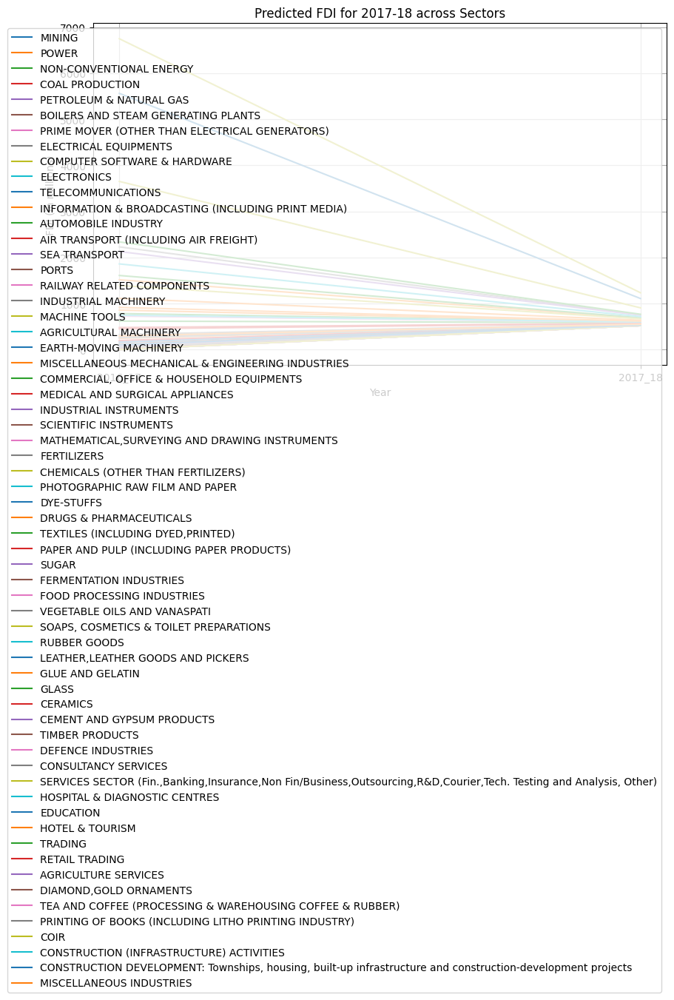

In [36]:
# Add predictions to the dataframe for visualization
df2['Predicted FDI 2017-18'] = fdi_2017_18_predictions

# Plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i, sector in enumerate(df2.index):
    plt.plot(['2016_17', '2017_18'], [df2['2016_17'].iloc[i], df2['Predicted FDI 2017-18'].iloc[i]], label=sector)
plt.title('Predicted FDI for 2017-18 across Sectors')
plt.xlabel('Year')
plt.ylabel('FDI (in millions)')
plt.legend()
plt.grid(True)
plt.show()

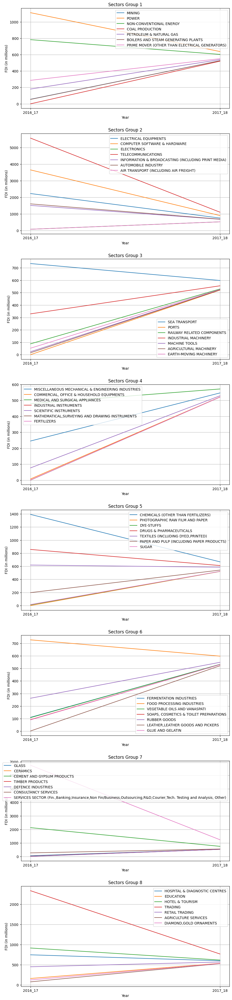

In [37]:
import matplotlib.pyplot as plt

# Assuming df2 is already loaded and contains the necessary columns

# Grouping sectors into manageable number of subplots
num_plots = 8  # Number of subplots
group_size = len(df2) // num_plots

fig, axes = plt.subplots(num_plots, 1, figsize=(10, 40))
fig.tight_layout(pad=5.0)

for i in range(num_plots):
    start_index = i * group_size
    end_index = start_index + group_size
    subset = df2.iloc[start_index:end_index]
    for index, row in subset.iterrows():
        axes[i].plot(['2016_17', '2017_18'], [row['2016_17'], row['Predicted FDI 2017-18']], label=index)
    axes[i].set_title(f'Sectors Group {i+1}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('FDI (in millions)')
    axes[i].legend()
    axes[i].grid(True)

plt.show()


In [38]:
selected_columns =  df2[['2016_17', 'Predicted FDI 2017-18']]
#df2[['fdi_2017_2018_predictions', '2016_17']]
Top_predicted_sectors= selected_columns.sort_values(by = 'Predicted FDI 2017-18', ascending=False)

In [39]:
Top_predicted_sectors.head(10)

,2016_17,Predicted FDI 2017-18
Sector,,
"SERVICES SECTOR (Fin.,Banking,Insurance,Non Fin/Business,Outsourcing,R&D,Courier,Tech. Testing and Analysis, Other)",6749.4344,1233.646973
TELECOMMUNICATIONS,5563.6900,1108.416373
COMPUTER SOFTWARE & HARDWARE,3651.7100,906.485499
TRADING,2338.4000,767.782251
ELECTRICAL EQUIPMENTS,2230.6900,756.406622
CEMENT AND GYPSUM PRODUCTS,2130.1000,745.782962
CONSTRUCTION (INFRASTRUCTURE) ACTIVITIES,1860.7300,717.333857
AUTOMOBILE INDUSTRY,1609.3200,690.781570
INFORMATION & BROADCASTING (INCLUDING PRINT MEDIA),1516.6800,680.997537


In [40]:
Top_predicted_sectors.tail(10)

,2016_17,Predicted FDI 2017-18
Sector,,
"LEATHER,LEATHER GOODS AND PICKERS",2.30,521.058585
TEA AND COFFEE (PROCESSING & WAREHOUSING COFFEE & RUBBER),1.60,520.984656
FERTILIZERS,0.89,520.909670
INDUSTRIAL INSTRUMENTS,0.80,520.900165
PORTS,0.00,520.815674
DEFENCE INDUSTRIES,0.00,520.815674
PHOTOGRAPHIC RAW FILM AND PAPER,0.00,520.815674
"MATHEMATICAL,SURVEYING AND DRAWING INSTRUMENTS",0.00,520.815674
COIR,0.00,520.815674


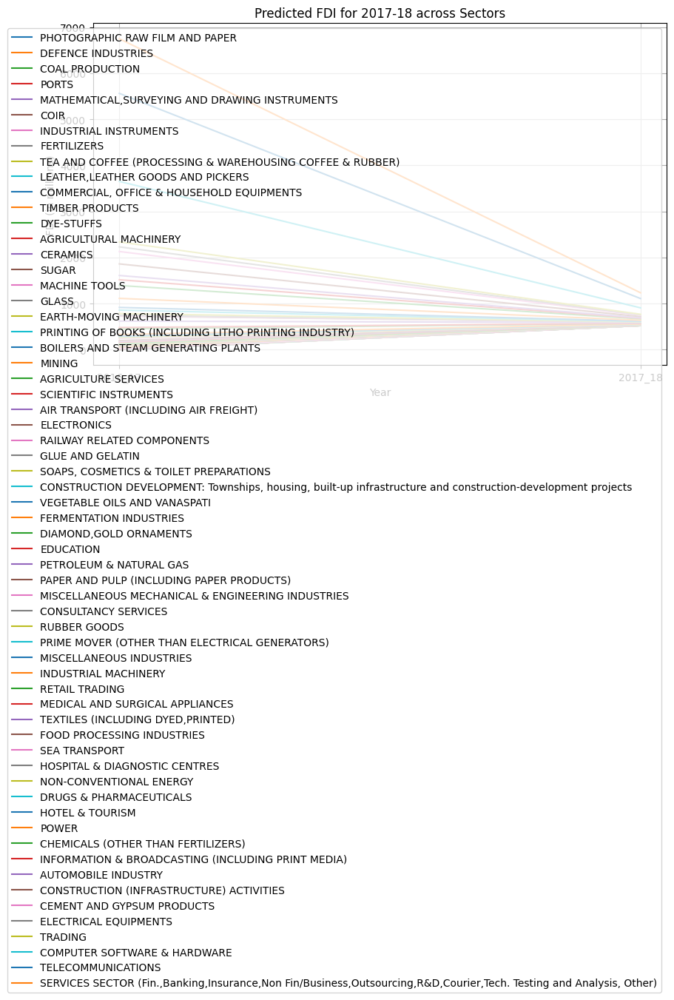

In [41]:
# Sort the sectors based on whether predicted FDI for 2017-18 is greater than 2016-17
df2['Difference'] = df2['Predicted FDI 2017-18'] - df2['2016_17']
sorted_sectors = df2.sort_values(by='Difference', ascending=False).index

# Plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for sector in sorted_sectors:
    plt.plot(['2016_17', '2017_18'], [df2.loc[sector, '2016_17'], df2.loc[sector, 'Predicted FDI 2017-18']], label=sector)
plt.title('Predicted FDI for 2017-18 across Sectors')
plt.xlabel('Year')
plt.ylabel('FDI (in millions)')
plt.legend()
plt.grid(True)
plt.show()

In [42]:
#sorted_sectors = df2.sort_values(by='Difference', ascending=False).index
#sorted_sectors
difference_columns =  df2[['2016_17', 'Predicted FDI 2017-18', 'Difference']]
#df2[['fdi_2017_2018_predictions', '2016_17']]#
Top_predicted_sectors2= difference_columns.sort_values(by = 'Difference', ascending=False).index

In [43]:
difference_columns

,2016_17,Predicted FDI 2017-18,Difference
Sector,,,
MINING,55.75,526.703626,470.953626
POWER,1112.98,638.361372,-474.618628
NON-CONVENTIONAL ENERGY,783.57,603.571234,-179.998766
COAL PRODUCTION,0.00,520.815674,520.815674
PETROLEUM & NATURAL GAS,180.40,539.868347,359.468347
...,...,...,...
PRINTING OF BOOKS (INCLUDING LITHO PRINTING INDUSTRY),53.17,526.431143,473.261143
COIR,0.00,520.815674,520.815674
CONSTRUCTION (INFRASTRUCTURE) ACTIVITIES,1860.73,717.333857,-1143.396143


In [44]:
Top_predicted_sectors2

Index(['PHOTOGRAPHIC RAW FILM AND PAPER', 'DEFENCE INDUSTRIES',
       'COAL PRODUCTION', 'PORTS',
       'MATHEMATICAL,SURVEYING AND DRAWING INSTRUMENTS', 'COIR',
       'INDUSTRIAL INSTRUMENTS', 'FERTILIZERS',
       'TEA AND COFFEE (PROCESSING & WAREHOUSING COFFEE & RUBBER)',
       'LEATHER,LEATHER GOODS AND PICKERS',
       'COMMERCIAL, OFFICE & HOUSEHOLD EQUIPMENTS', 'TIMBER PRODUCTS',
       'DYE-STUFFS', 'AGRICULTURAL MACHINERY', 'CERAMICS', 'SUGAR',
       'MACHINE TOOLS', 'GLASS', 'EARTH-MOVING MACHINERY',
       'PRINTING OF BOOKS (INCLUDING LITHO PRINTING INDUSTRY)',
       'BOILERS AND STEAM GENERATING PLANTS', 'MINING', 'AGRICULTURE SERVICES',
       'SCIENTIFIC INSTRUMENTS', 'AIR TRANSPORT (INCLUDING AIR FREIGHT)',
       'ELECTRONICS', 'RAILWAY RELATED COMPONENTS', 'GLUE AND GELATIN',
       'SOAPS, COSMETICS & TOILET PREPARATIONS',
       'CONSTRUCTION DEVELOPMENT: Townships, housing, built-up infrastructure and construction-development projects',
       'VEGETABLE OIL

In [45]:
# Create a tabular form
tabular_data = df2[['2016_17', 'Predicted FDI 2017-18', 'Difference']].reset_index()
tabular_data = tabular_data.sort_values(by='Difference', ascending=False)
tabular_data.columns = ['Sector', '2016-17', 'Predicted FDI 2017-18', 'Difference']
print(tabular_data.to_string(index=False))

                                                                                                             Sector   2016-17  Predicted FDI 2017-18   Difference
                                                                                    PHOTOGRAPHIC RAW FILM AND PAPER    0.0000             520.815674   520.815674
                                                                                                 DEFENCE INDUSTRIES    0.0000             520.815674   520.815674
                                                                                                    COAL PRODUCTION    0.0000             520.815674   520.815674
                                                                                                              PORTS    0.0000             520.815674   520.815674
                                                                     MATHEMATICAL,SURVEYING AND DRAWING INSTRUMENTS    0.0000             520.815674   520.815674
                            

In [46]:
df2.reset_index(inplace=True)


In [47]:
sector_data = df2['Sector']
sector_data

0                                                MINING
1                                                 POWER
2                               NON-CONVENTIONAL ENERGY
3                                       COAL PRODUCTION
4                               PETROLEUM & NATURAL GAS
                            ...                        
57    PRINTING OF BOOKS (INCLUDING LITHO PRINTING IN...
58                                                 COIR
59             CONSTRUCTION (INFRASTRUCTURE) ACTIVITIES
60    CONSTRUCTION DEVELOPMENT: Townships, housing, ...
61                             MISCELLANEOUS INDUSTRIES
Name: Sector, Length: 62, dtype: object

In [48]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()

In [49]:
sector_encoded = encoder.fit_transform(sector_data.values.reshape(-1, 1))
sector_encoded_df = pd.DataFrame(sector_encoded.toarray(), columns=encoder.get_feature_names_out(['Sector']))

In [50]:
combined_data = pd.concat([df2.drop('Sector', axis=1), sector_encoded_df], axis=1)
correlation_matrix2 = combined_data.corr()

In [51]:
correlation_matrix2

,2000_01,2001_02,2002_03,2003_04,2004_05,2005_06,2006_07,2007_08,2008_09,2009_10,...,Sector_SEA TRANSPORT,"Sector_SERVICES SECTOR (Fin.,Banking,Insurance,Non Fin/Business,Outsourcing,R&D,Courier,Tech. Testing and Analysis, Other)","Sector_SOAPS, COSMETICS & TOILET PREPARATIONS",Sector_SUGAR,Sector_TEA AND COFFEE (PROCESSING & WAREHOUSING COFFEE & RUBBER),Sector_TELECOMMUNICATIONS,"Sector_TEXTILES (INCLUDING DYED,PRINTED)",Sector_TIMBER PRODUCTS,Sector_TRADING,Sector_VEGETABLE OILS AND VANASPATI
2000_01,1.000000,0.569471,0.685090,0.692305,0.443509,0.558639,0.353707,0.249939,0.375970,0.357411,...,-0.052338,0.069804,-0.056606,-0.056606,-0.020779,0.258073,-0.052957,-0.056606,-0.036257,-0.056606
2001_02,0.569471,1.000000,0.527787,0.483728,0.420448,0.608059,0.358725,0.369286,0.406125,0.460441,...,-0.036874,0.104787,-0.053565,-0.053565,-0.053447,0.621665,-0.049116,-0.053523,-0.017109,-0.053565
2002_03,0.685090,0.527787,1.000000,0.791692,0.682273,0.666938,0.623926,0.495102,0.502470,0.492244,...,-0.019684,0.395792,-0.065305,-0.059128,-0.065305,0.232820,0.018998,-0.065243,-0.005976,-0.065305
2003_04,0.692305,0.483728,0.791692,1.000000,0.827879,0.685484,0.761137,0.612675,0.618338,0.509922,...,-0.024846,0.481194,-0.069419,-0.069419,-0.068769,0.106213,-0.050453,-0.069195,-0.006225,-0.065987
2004_05,0.443509,0.420448,0.682273,0.827879,1.000000,0.745291,0.837706,0.677180,0.729451,0.560100,...,-0.014570,0.539935,-0.062269,-0.059558,-0.063433,0.093077,-0.006515,-0.063354,-0.044637,-0.051423
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sector_TELECOMMUNICATIONS,0.258073,0.621665,0.232820,0.106213,0.093077,0.419399,0.068829,0.140715,0.250305,0.319168,...,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,1.000000,-0.016393,-0.016393,-0.016393,-0.016393
"Sector_TEXTILES (INCLUDING DYED,PRINTED)",-0.052957,-0.049116,0.018998,-0.050453,-0.006515,0.011531,-0.011711,-0.024783,-0.038412,-0.036759,...,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,1.000000,-0.016393,-0.016393,-0.016393
Sector_TIMBER PRODUCTS,-0.056606,-0.053523,-0.065243,-0.069195,-0.063354,-0.061685,-0.040945,-0.053258,-0.056071,-0.058172,...,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,1.000000,-0.016393,-0.016393
Sector_TRADING,-0.036257,-0.017109,-0.005976,-0.006225,-0.044637,-0.039409,-0.014533,-0.000216,0.020285,0.050798,...,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,-0.016393,1.000000,-0.016393


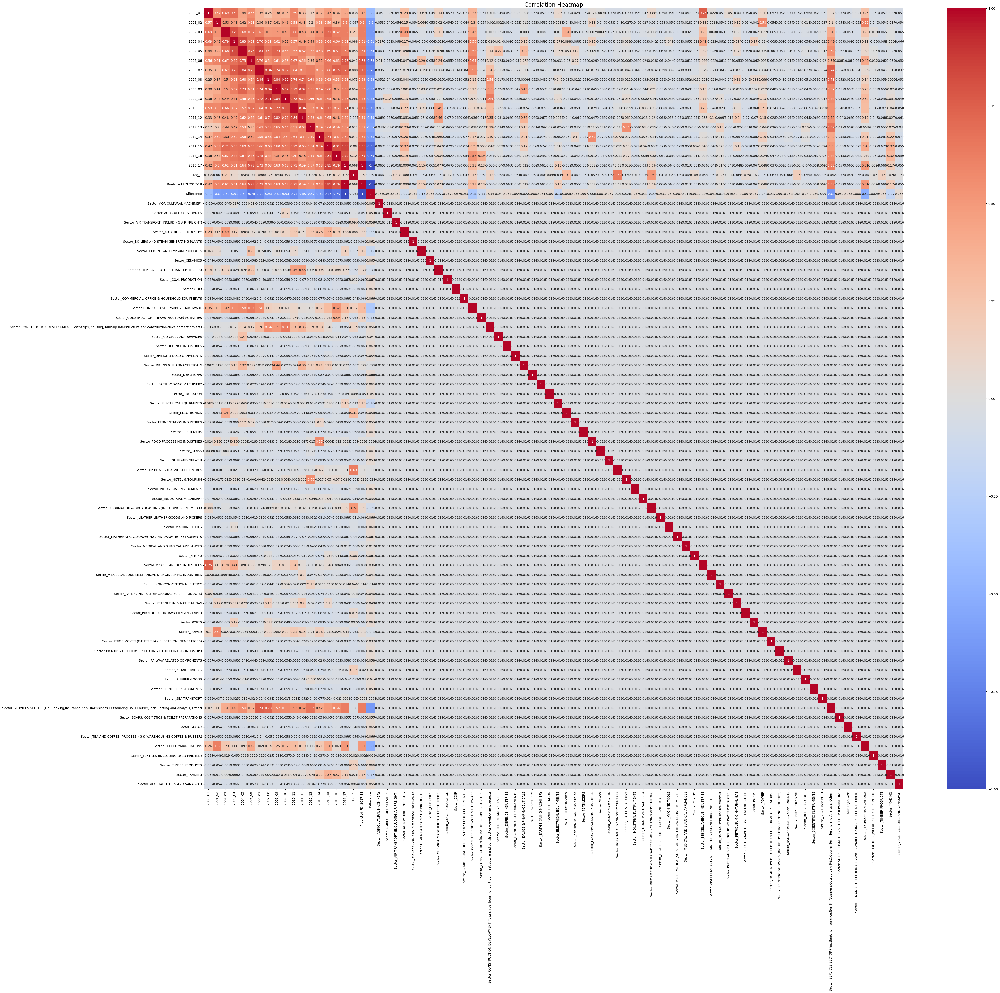

In [52]:
# Create a heatmap of the correlation matrix
plt.figure(figsize=(50, 45))
sns.heatmap(correlation_matrix2, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap', fontsize=18)
plt.show()

relationship between sectors and the years - 2006_07, 2007_08, 2012_13, 2016_17
1. computer software and hardware - 2005_06
2. Construction development: townships, housing, - 2009_10
3. Food prodction industries - 2013_14
4. Miscellaeanous indsurtries - 2000_01


In [52]:
Note: there is no relationships between different sectors